<a href="https://colab.research.google.com/github/dvasant97/Big-Data_Georgian/blob/main/stock_analysis_pyspark.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><b>Implementing Stock Market Analysis Of 4 Companie Using Python Spark (APPLE, AMAZON, GOOGLE AND NETFLIX)</b></h1>

<b>Analysis Performed By -</b>
1. Dhaval Vasant - 200533817
2. Dayana Singh - 200552800
3. Harsh Bhavsar - 200556274
4. Yash Jain - 200555855

**Importing Required Libraries**

In [1]:
!pip install pyspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.9/316.9 MB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.0-py2.py3-none-any.whl size=317425345 sha256=b39a2dff8195329e21e7ac1523e5cf0fde957f290bd8abe77a2af4f6b514de8e
  Stored in directory: /root/.cache/pip/wheels/41/4e/10/c2cf2467f71c678cfc8a6b9ac9241e5e44a01940da8fbb17fc
Successfully built pyspark


In [17]:
import pyspark as ps
from pyspark.sql import SparkSession
from pyspark.sql import SQLContext

spark = SparkSession.builder.getOrCreate()

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

**READING DATA**

In [19]:
df1=spark.read.csv("AAPL(Apple).csv", inferSchema=True, header=True)
df2=spark.read.csv("GOOG(Google).csv" , inferSchema=True, header=True)
df3=spark.read.csv("AMZN(Amazon).csv", inferSchema=True, header=True)
df4=spark.read.csv("NFLX(Netflix).csv", inferSchema=True, header=True)

**Implementation of SQL Commands on PySpark DataFrame**

In [21]:
#Creating Table
df1.createTempView('AppleStock')
sqlContext = SQLContext(spark)
#Running Query
d_ = sqlContext.sql("SELECT * from AppleStock").toPandas()
d_.head(5)

AnalysisException: ignored

**Converting PySpark DataFrames to Pandas DataFrames for Data Visualisation**

In [22]:
df1=df1.toPandas()
df2=df2.toPandas()
df3=df3.toPandas()
df4=df4.toPandas()

In [23]:
cnames=['AAPL(Apple).csv', 'AMZN(Amazon).csv','GOOG(Google).csv','NFLX(Netflix).csv']

In [9]:
cnames.sort()

In [24]:
cnames

['AAPL(Apple).csv',
 'AMZN(Amazon).csv',
 'GOOG(Google).csv',
 'NFLX(Netflix).csv']

<h5><b>GIVING NAMES TO ALL THE DATAFRAMES FOR EASY REFERENCING</b></h5>

In [25]:
df_cname={}
df_list=[df1,df2,df3,df4]
for i in range(4):
    df_cname[cnames[i][:-4]]=df_list[i]

In [27]:
import pandas as pd
#standard dataframe with complete dates
df_date=pd.read_csv("AAPL(Apple).csv")

In [14]:
def set_ind(df,cmp_name):
    df[df.columns[0]] = df[df.columns[0]].apply(pd.to_datetime)
    df['Company']=cmp_name
    df.set_index('Company',inplace=True)

In [28]:
for i in df_cname.keys():
    set_ind(df_cname[i],i)

In [29]:
df1.head()

,Date,Open,High,Low,Close,Adj Close,Volume
Company,,,,,,,
AAPL(Apple),2013-01-02,19.779285,19.821428,19.343929,19.608213,16.862818,560518000
AAPL(Apple),2013-01-03,19.567142,19.631071,19.321428,19.360714,16.649981,352965200
AAPL(Apple),2013-01-04,19.177500,19.236786,18.779642,18.821428,16.186199,594333600
AAPL(Apple),2013-01-07,18.642857,18.903570,18.400000,18.710714,16.090986,484156400
AAPL(Apple),2013-01-08,18.900356,18.996071,18.616072,18.761070,16.134293,458707200


In [30]:
df2.head()

,Date,Open,High,Low,Close,Adj Close,Volume
Company,,,,,,,
AMZN(Amazon),2013-01-02,17.918339,18.107130,17.846855,18.013729,18.013729,102033017
AMZN(Amazon),2013-01-03,18.055573,18.229919,17.950716,18.024191,18.024191,93075567
AMZN(Amazon),2013-01-04,18.165413,18.467529,18.124067,18.380356,18.380356,110954331
AMZN(Amazon),2013-01-07,18.317591,18.415474,18.196297,18.300158,18.300158,66476239
AMZN(Amazon),2013-01-08,18.319834,18.338762,18.043119,18.264042,18.264042,67295297


In [31]:
df3.head()

,Date,Open,High,Low,Close,Adj Close,Volume
Company,,,,,,,
GOOG(Google),2013-01-02,12.8040,12.9050,12.6630,12.8655,12.8655,65420000
GOOG(Google),2013-01-03,12.8635,13.0440,12.8185,12.9240,12.9240,55018000
GOOG(Google),2013-01-04,12.8790,12.9900,12.8325,12.9575,12.9575,37484000
GOOG(Google),2013-01-07,13.1485,13.4865,13.1335,13.4230,13.4230,98200000
GOOG(Google),2013-01-08,13.3535,13.4490,13.1785,13.3190,13.3190,60214000


In [32]:
df4.head()

,Date,Open,High,Low,Close,Adj Close,Volume
Company,,,,,,,
NFLX(Netflix),2013-01-02,13.601429,13.687143,12.955714,13.144286,13.144286,19431300
NFLX(Netflix),2013-01-03,13.138571,13.988571,13.075714,13.798571,13.798571,27912500
NFLX(Netflix),2013-01-04,13.791429,13.958571,13.648571,13.711429,13.711429,17761100
NFLX(Netflix),2013-01-07,13.770000,14.535714,13.731429,14.171429,14.171429,45550400
NFLX(Netflix),2013-01-08,14.287143,14.427143,13.828571,13.880000,13.880000,24714900


ANALYSING VOLUMES OF STOCK TRADED

In [61]:
def volume_analysis(df,cmp_name):
    plt.figure(figsize=(8,4))
    plt.plot(df['Date'],df['Volume'],c='Green')
    plt.title('Volume Of '+cmp_name+' Stock Traded')
    plt.ylabel('Volume')
    plt.show()

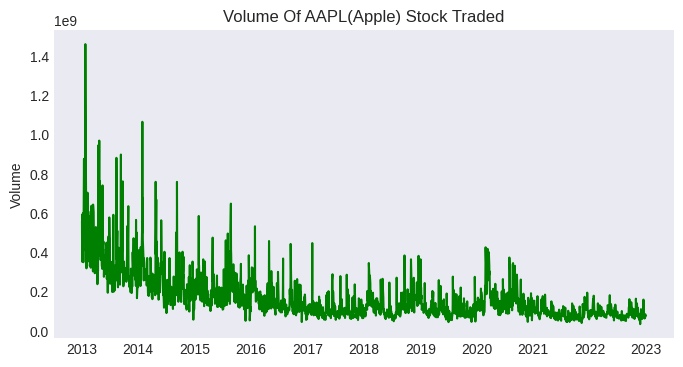

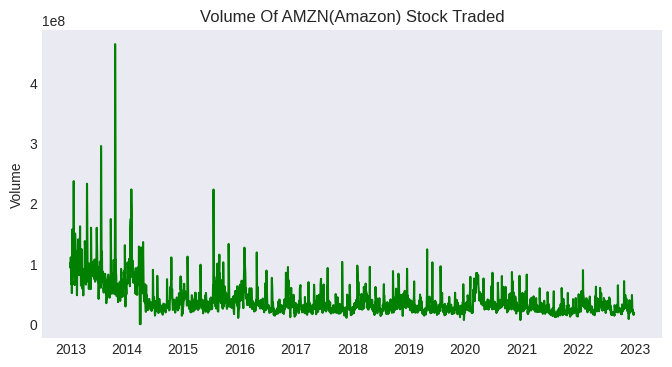

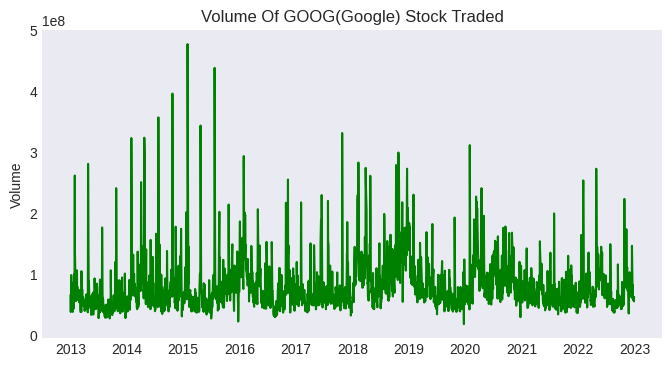

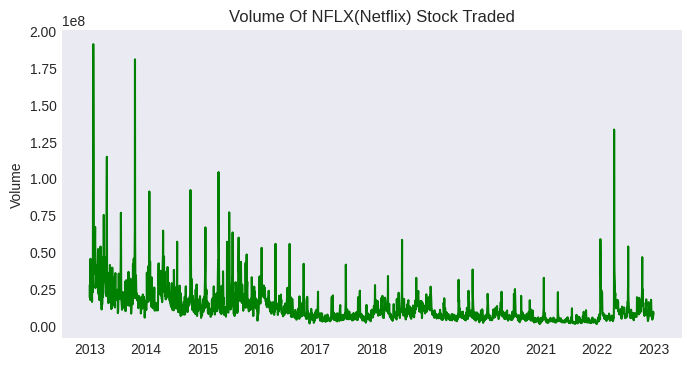

In [62]:
for i in df_cname.keys():
    volume_analysis(df_cname[i],i)

<h4>Analysing Opening and Closing price trends</h4>

In [66]:
import plotly.express as px
from IPython.display import HTML

def price(df, name):
    fig = px.histogram(df, x='Date', y=['Open', 'Close'],
                       template='plotly_dark',
                       color_discrete_sequence=['green', 'coral'],
                       title='{} Opening and Closing Stock Price Over Time'.format(name)
                       )
    fig.update_layout(
        xaxis_title="Date", yaxis_title="Stock Price"
    )

    # Save the Plotly chart as an HTML file
    html_file_path = f"{name}_stock_price_chart.html"
    fig.write_html(html_file_path)

    # Display the HTML file in the Colab notebook
    display(HTML(html_file_path))

print('PLOTS OF OPENING AND CLOSING PRICE')
print('\n\n\n')

for i in df_cname.keys():
    price(df_cname[i], i)

print('\n\n\n')


PLOTS OF OPENING AND CLOSING PRICE






<h4>A comparitive analysis of the high and low prices of stock over the years showing change in the daily range of trading.</h4>

In [69]:
def high_low(df,cmp_name):
    plt.figure(figsize=(20,8))
    plt.style.use('seaborn-deep')
    df['Daily Range']= df['High']-df['Low']
    plt.plot(df['Date'],df['Daily Range'],c='coral')
    plt.xlabel("Years")
    plt.ylabel("Stock Price Trading Range")
    plt.title("Daily Stock Price Range for "+cmp_name)
    plt.show()



PLOTS OF DAILY TRAIDNG RANGE






<ipython-input-69-d84f6481077b>:3: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



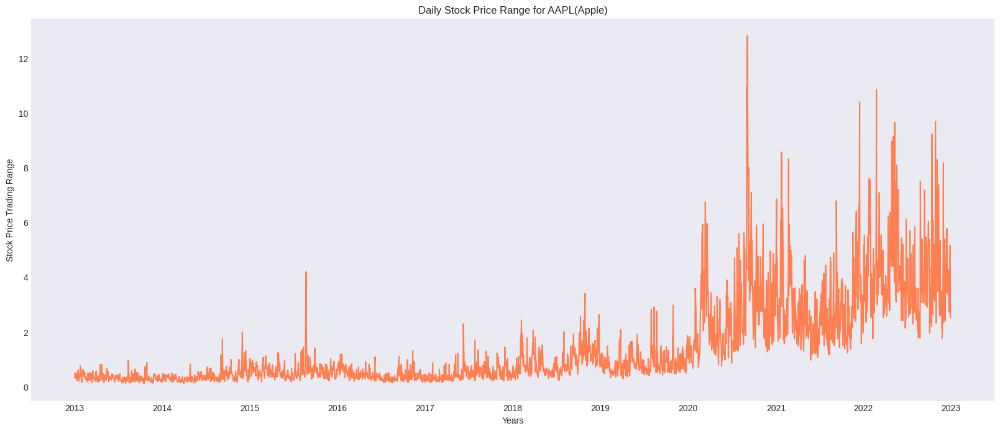

<ipython-input-69-d84f6481077b>:3: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



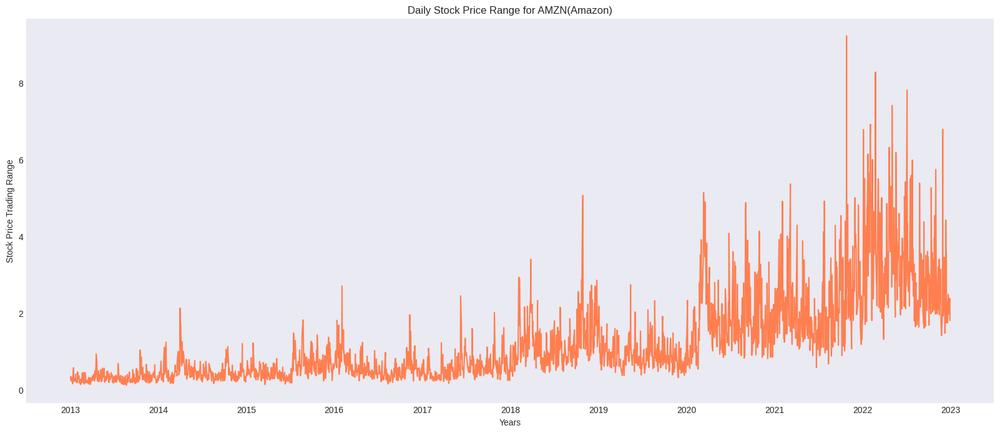

<ipython-input-69-d84f6481077b>:3: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



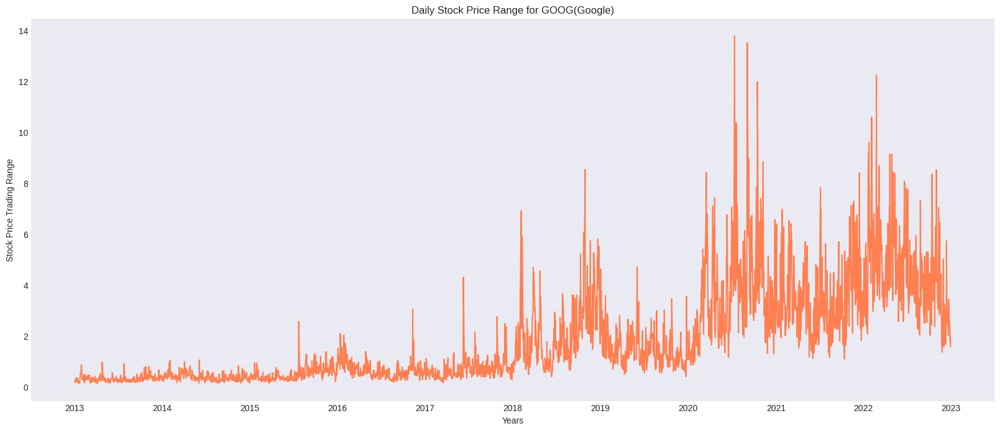

<ipython-input-69-d84f6481077b>:3: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



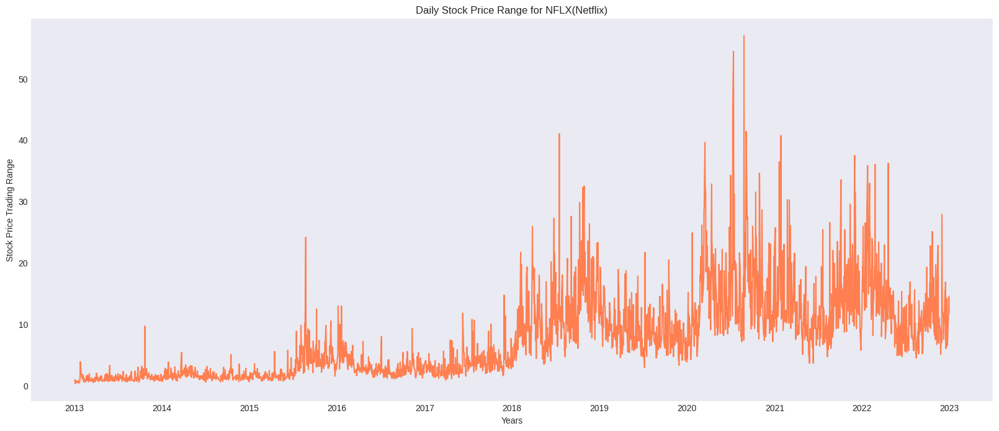

In [70]:
print('PLOTS OF DAILY TRAIDNG RANGE')
print('\n\n\n')
for i in df_cname.keys():
    high_low(df_cname[i],i)

<h4>Analysing the Daily Returns on Stock</h4>

In [43]:
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'colab'


def daily_returns(df, name):
    df['Daily Return'] = df['Adj Close'].pct_change()
    # We chose Adj Close here because it is indicated as the fair price of the stock on that day.
    # However, you may also take Close price for the analysis.

    fig = px.histogram(df, x='Date', y='Daily Return',
                       template='plotly_dark',
                       nbins=60,
                       color_discrete_sequence=['cyan'],
                       title='{} Daily Returns on stock'.format(name))

    fig.update_layout(xaxis_title="Date", yaxis_title="Daily Returns(%)")

    pio.show(fig)

# Example usage
print('PLOTS OF DAILY STOCK RETURNS')
print('\n\n\n')
for i in df_cname.keys():
    daily_returns(df_cname[i], i)


PLOTS OF DAILY STOCK RETURNS






<h2>Comparing Stock Prices of Companies</h2>

WE HAVE ANALYSED THE STOCK PRICES OF INDIVIDUAL COMPANIES, NOW LET'S COMPARE THEM WITH EACH OTHER

**VISUALISE THE CHANGE IN STOCK PRICE OVER THE YEARS**

In [47]:
new_dict=df_cname

In [48]:
def compare(price_type):
    print(price_type +" Price Comparison")
    print('\n')
    plt.figure(figsize=(20,15))
    plt.style.use('seaborn-dark')
    for i in new_dict.keys():
        plt.plot(new_dict[i]['Date'],new_dict[i][price_type], label = i)

    plt.legend()
    plt.xlabel("Years")
    plt.ylabel(price_type+" Price")
    plt.title(price_type +" Price Comparison")
    plt.show()
    print('\n')

Open Price Comparison




<ipython-input-48-0c75030f2581>:5: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



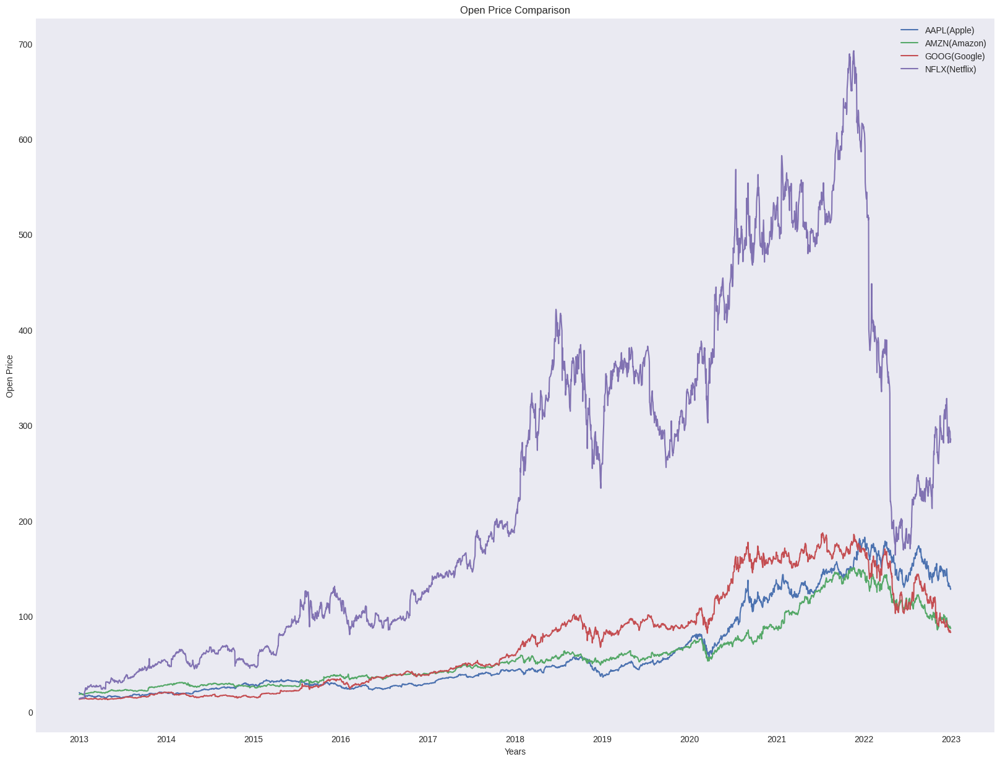



High Price Comparison




<ipython-input-48-0c75030f2581>:5: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



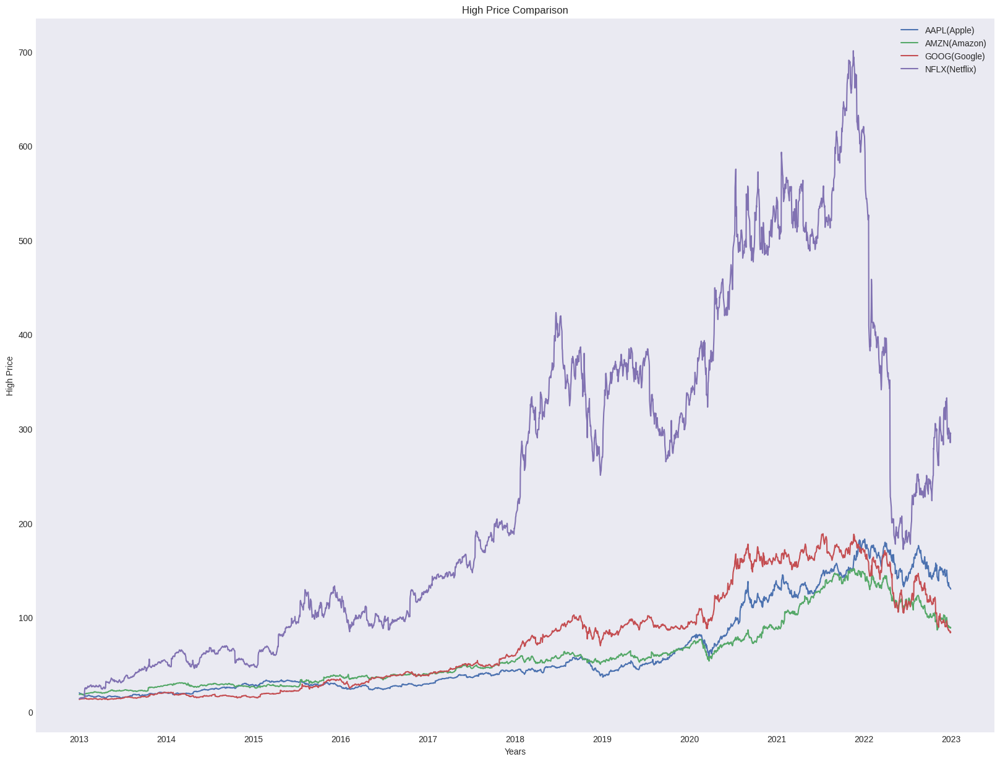



Low Price Comparison




<ipython-input-48-0c75030f2581>:5: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



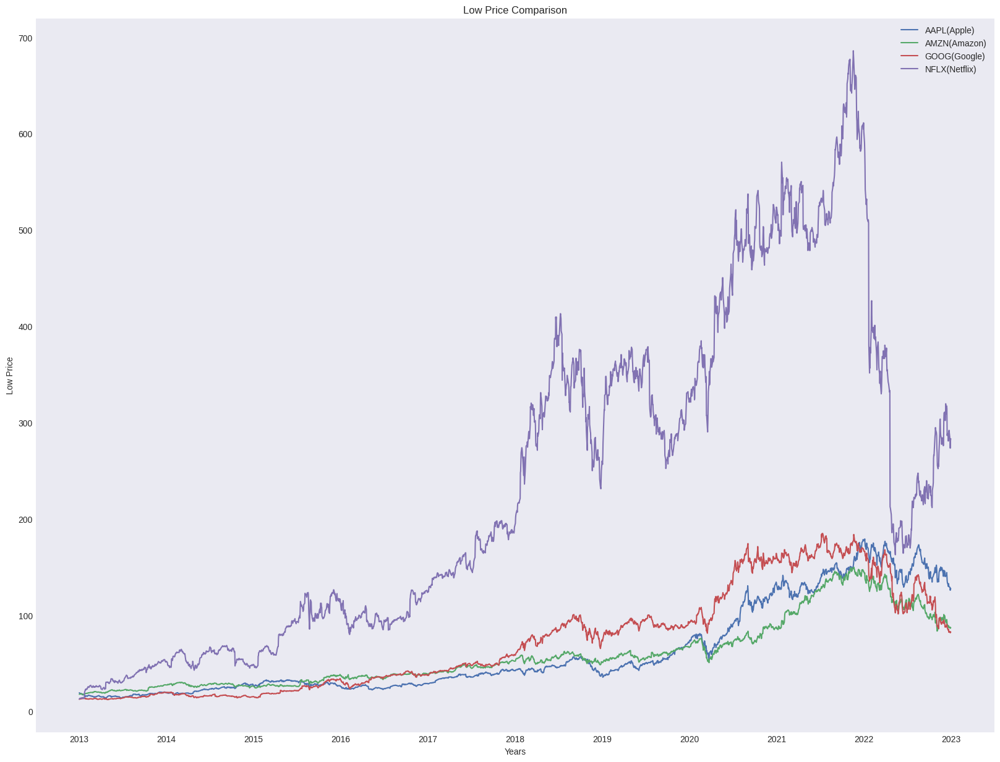



Close Price Comparison




<ipython-input-48-0c75030f2581>:5: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



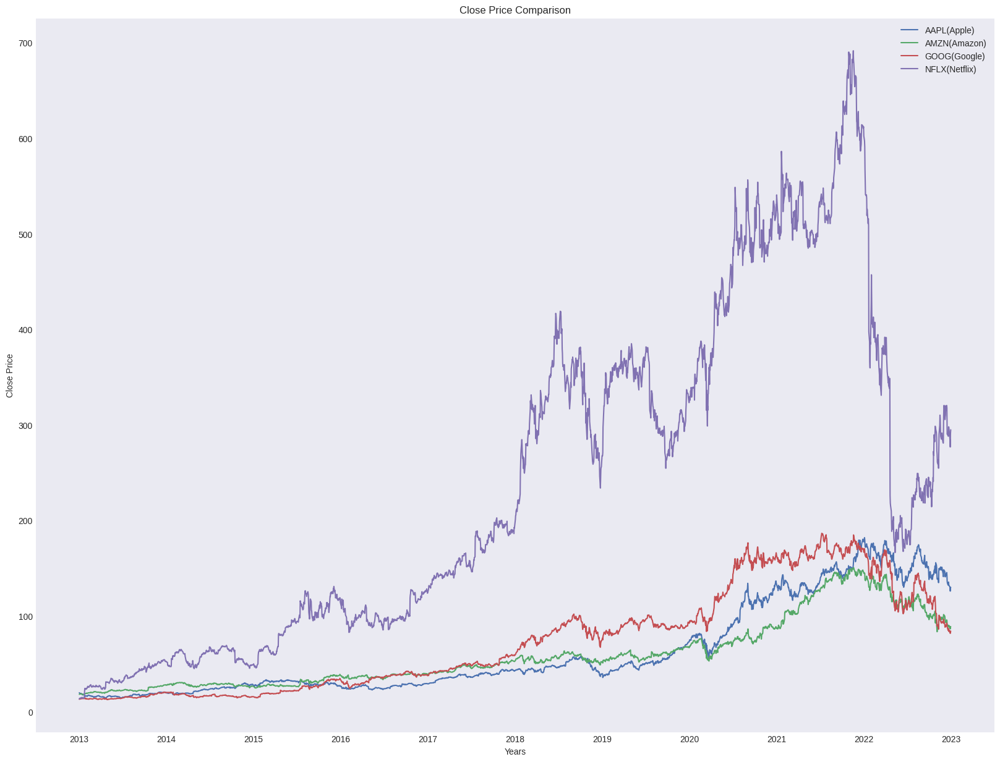



Adj Close Price Comparison




<ipython-input-48-0c75030f2581>:5: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



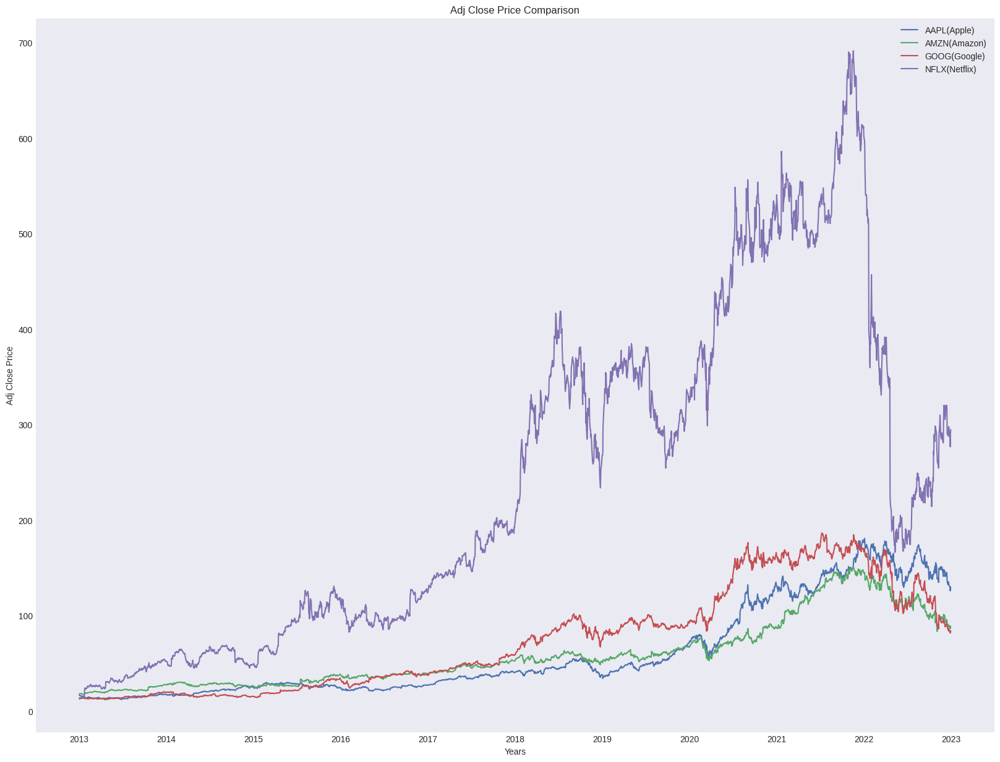

In [49]:
price=['Open','High','Low','Close','Adj Close']
for p in price:
    compare(p)